<a href="https://colab.research.google.com/github/freentour/AIFFEL_quest/blob/main/Exploration_quest/diffusers/1_8_diffusers.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 패키지 설치

In [1]:
# Stable Diffusion 설치
!pip install --upgrade -qq git+https://github.com/huggingface/diffusers.git transformers accelerate

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.7/43.7 kB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.5/9.5 MB 54.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 315.1/315.1 kB 20.0 MB/s eta 0:00:00


In [2]:
# controlnet-aux를 설치합니다. Human pose를 검출해주는 controlnet의 보조용 모델입니다.
!pip install controlnet-aux==0.0.1

In [33]:
# import torch

# 메모리 삭제
torch.cuda.empty_cache()

# ControlNet 로드

In [19]:
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel

canny_controlnet = ControlNetModel.from_pretrained("lllyasviel/sd-controlnet-canny", torch_dtype=torch.float16)
canny_pipe = StableDiffusionControlNetPipeline.from_pretrained(
    "runwayml/stable-diffusion-v1-5", controlnet=canny_controlnet, torch_dtype=torch.float16
)

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


In [20]:
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel

openpose_controlnet = ControlNetModel.from_pretrained("lllyasviel/sd-controlnet-openpose", torch_dtype=torch.float16)
openpose_pipe = StableDiffusionControlNetPipeline.from_pretrained(
    "runwayml/stable-diffusion-v1-5", controlnet=openpose_controlnet, torch_dtype=torch.float16
)

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

# 개별 테스트

## 윤곽선 검출 테스트

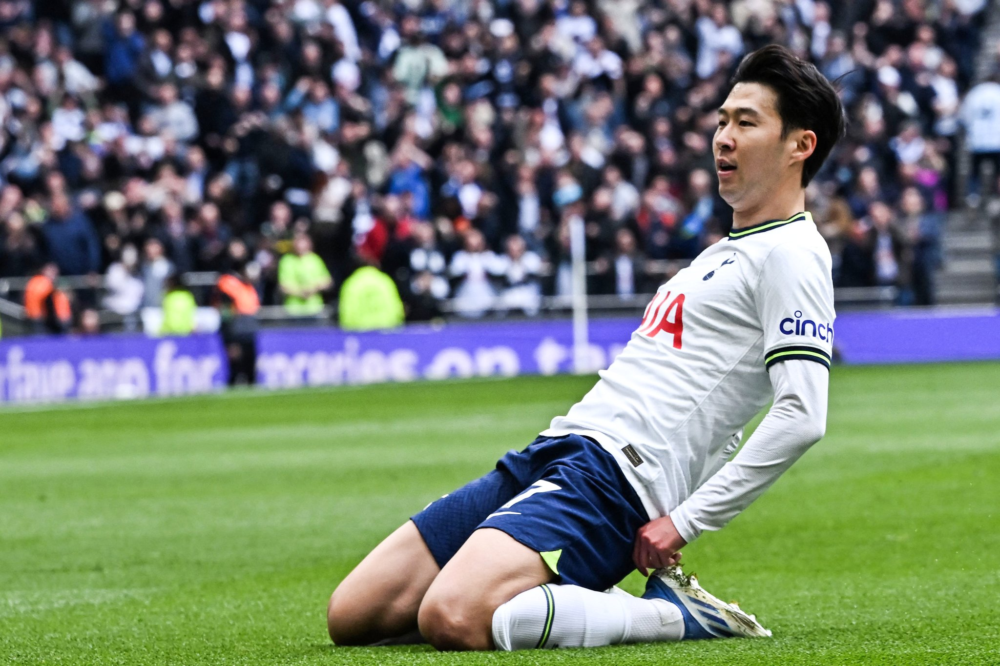

In [17]:
import torch
from diffusers.utils import load_image
import cv2
from PIL import Image
import numpy as np

# Q. 코드를 작성해 보세요.
# 이미지를 불러오세요.
# https://upload.wikimedia.org/wikipedia/commons/f/f0/Everest_North_Face_toward_Base_Camp_Tibet_Luca_Galuzzi_2006_edit_1.jpg
# https://pds.joongang.co.kr/news/component/htmlphoto_mmdata/202306/30/600bf991-8995-4944-9fb3-d6199f4f7443.jpg
canny_image = load_image(
    "https://pds.joongang.co.kr/news/component/htmlphoto_mmdata/202306/30/600bf991-8995-4944-9fb3-d6199f4f7443.jpg"
)

canny_image

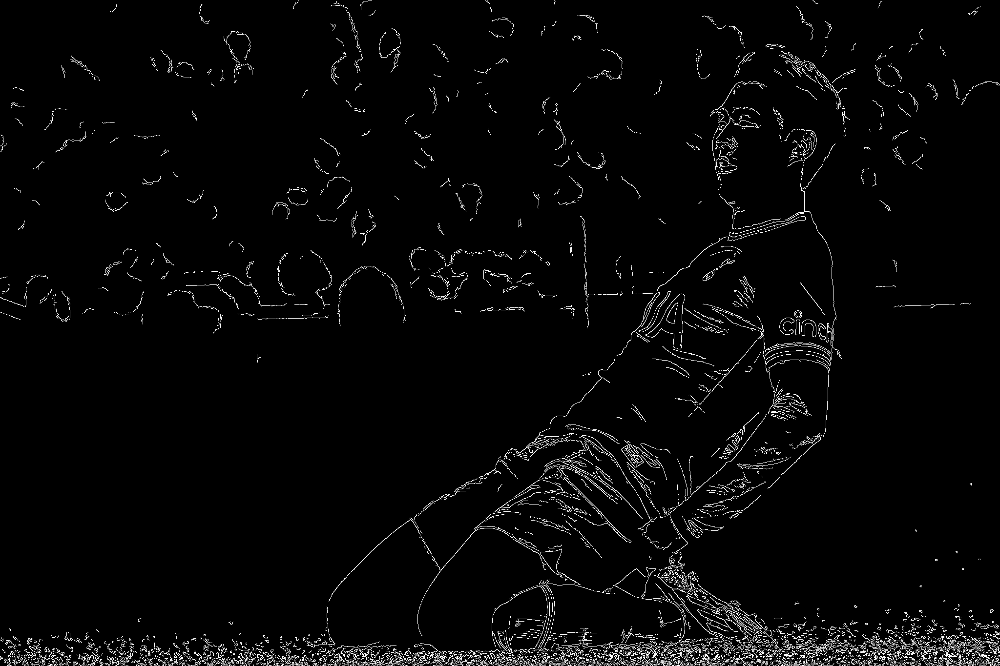

In [18]:
#threshhold를 지정합니다.
low_threshold = 100
high_threshold = 200

# 이미지를 NumPy 배열로 변환합니다.
canny_image = np.array(canny_image)

# # 인체 감지 포즈를 넣어줄 가운데 부분을 지워줍니다.
# zero_start = canny_image.shape[1] // 4
# zero_end = zero_start + canny_image.shape[1] // 2
# canny_image[:, zero_start:zero_end] = 0

# 윤곽선을 검출하고 NumPy 배열을 PIL 이미지로 변환합니다.
canny_image = cv2.Canny(canny_image, low_threshold, high_threshold)
canny_image = canny_image[:, :, None]
canny_image = np.concatenate([canny_image, canny_image, canny_image], axis=2)
canny_image = Image.fromarray(canny_image)  # NumPy 배열을 PIL 이미지로 변환합니다.

canny_image

  0%|          | 0/20 [00:00<?, ?it/s]

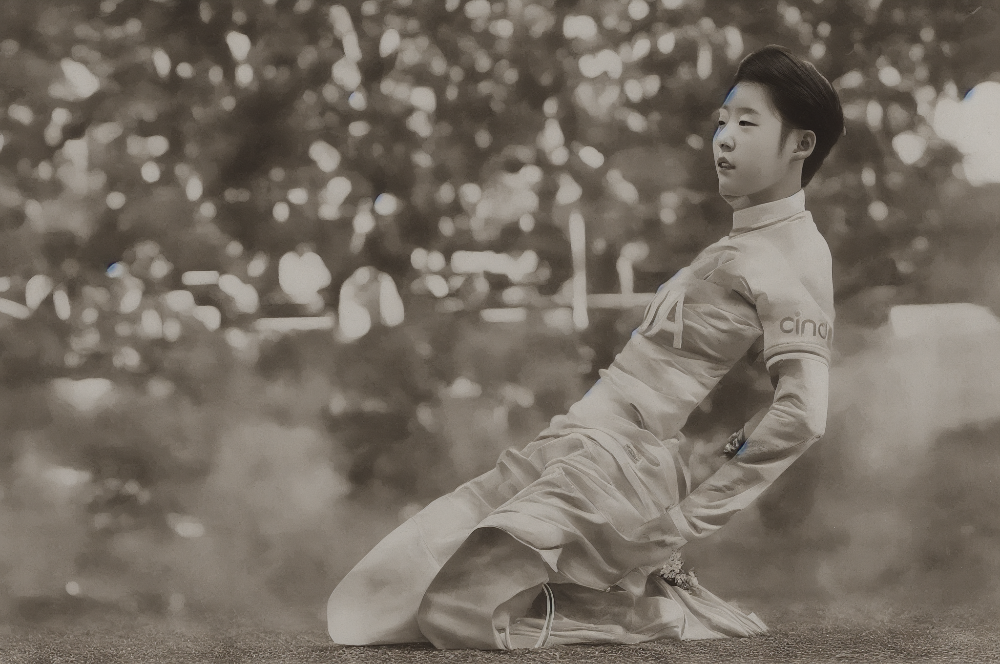

In [23]:
from diffusers import UniPCMultistepScheduler
canny_pipe.scheduler = UniPCMultistepScheduler.from_config(canny_pipe.scheduler.config)
canny_pipe = canny_pipe.to("cuda")

# 동일한 이미지를 생성하기 위해 seed를 지정합니다.
generator = torch.manual_seed(0)

# 이미지를 생성합니다.
new_canny_image = canny_pipe(
    prompt="korean young girl wearing HANBOK",
    num_inference_steps=20,
    generator=generator,
    image=canny_image
).images[0]

# 생성된 이미지를 저장합니다.
new_canny_image.save("canny_image.png")

# 생성된 이미지를 출력합니다.
new_canny_image

## 인체 자세 감지 테스트

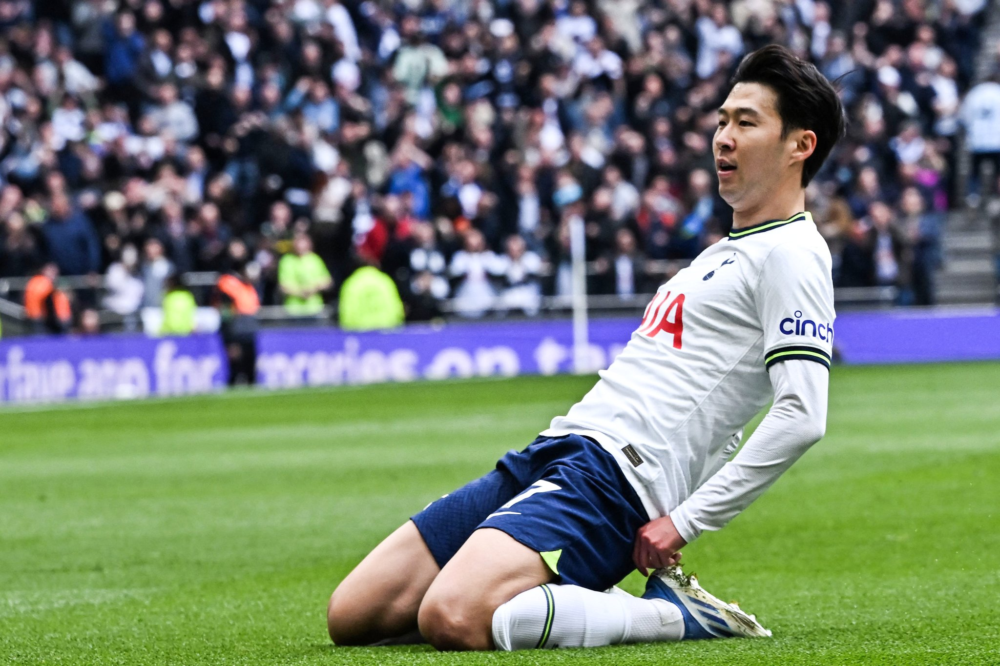

In [24]:
openpose_image = load_image(
    "https://pds.joongang.co.kr/news/component/htmlphoto_mmdata/202306/30/600bf991-8995-4944-9fb3-d6199f4f7443.jpg"
)

openpose_image

cuda


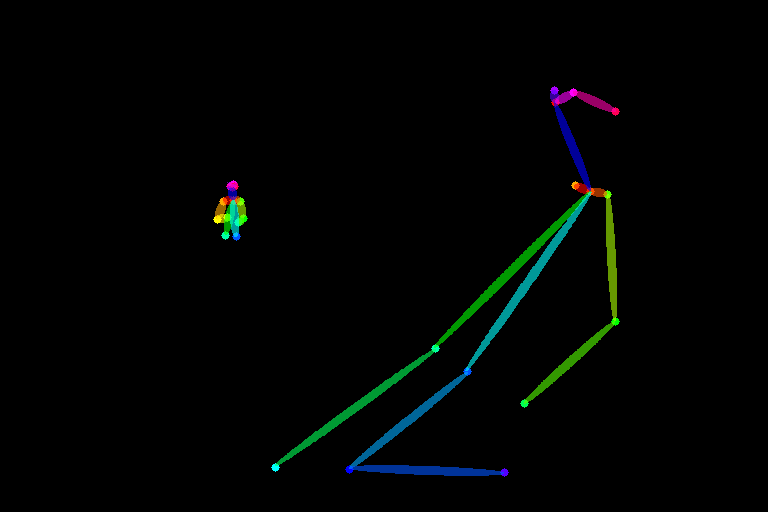

In [25]:
from controlnet_aux import OpenposeDetector

# 인체의 자세를 검출하는 사전 학습된 ControlNet 불러오기
openpose = OpenposeDetector.from_pretrained("lllyasviel/ControlNet")

# 이미지에서 자세 검출
openpose_image = openpose(openpose_image)
openpose_image

  0%|          | 0/20 [00:00<?, ?it/s]

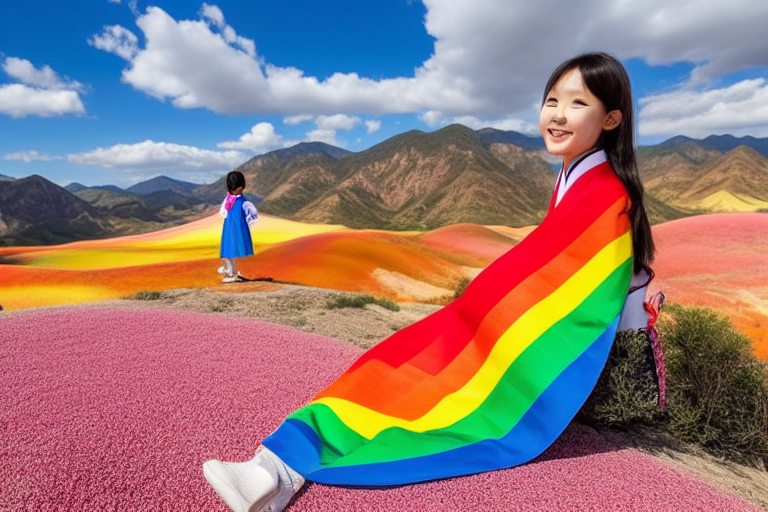

In [26]:
from diffusers import UniPCMultistepScheduler

openpose_pipe.scheduler = UniPCMultistepScheduler.from_config(openpose_pipe.scheduler.config)
openpose_pipe = openpose_pipe.to("cuda")

# Q. 코드를 작성해 보세요.
# 동일한 이미지를 생성하기 위해 seed를 넣어줍니다.
generator = torch.manual_seed(0)

#프롬프트를 작성합니다.
prompt = "korean young girl wearing HANBOK behind rainbow mountains"
negative_prompt = "dark, blurry, low quality, abstract, surreal, exaggerated, unrealistic, muted colors, chaotic background, low resolution, rough brushstrokes, cartoonish"

images = openpose_image

# 이미지를 생성합니다.
openpose_image1 = openpose_pipe(
    prompt=prompt,
    negative_prompt=negative_prompt,
    num_inference_steps=20,
    generator=generator,
    image=images
).images[0]

# 생성된 이미지를 출력합니다.
openpose_image1

# [프로젝트] 윤곽선 검출 + 인체 자세 감지

## 윤곽선 검출

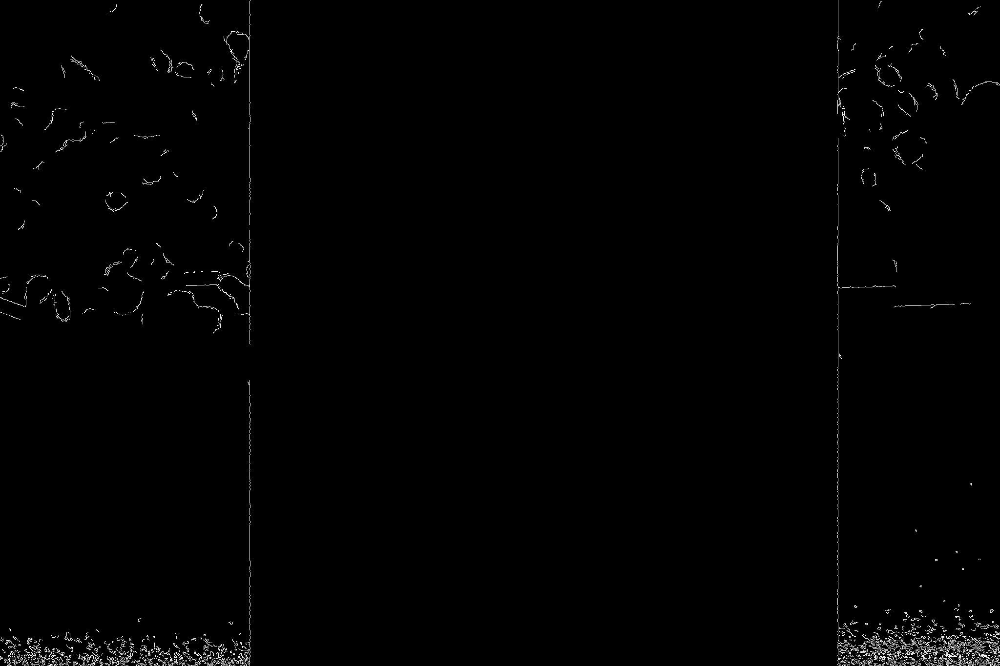

In [30]:
import torch
from diffusers.utils import load_image
import cv2
from PIL import Image
import numpy as np

# Q. 코드를 작성해 보세요.
# 이미지를 불러오세요.
# https://upload.wikimedia.org/wikipedia/commons/f/f0/Everest_North_Face_toward_Base_Camp_Tibet_Luca_Galuzzi_2006_edit_1.jpg
# https://pds.joongang.co.kr/news/component/htmlphoto_mmdata/202306/30/600bf991-8995-4944-9fb3-d6199f4f7443.jpg
canny_image = load_image(
    "https://pds.joongang.co.kr/news/component/htmlphoto_mmdata/202306/30/600bf991-8995-4944-9fb3-d6199f4f7443.jpg"
)

#threshhold를 지정합니다.
low_threshold = 100
high_threshold = 200

# 이미지를 NumPy 배열로 변환합니다.
canny_image = np.array(canny_image)

# 인체 감지 포즈를 넣어줄 가운데 부분을 지워줍니다.
zero_start = canny_image.shape[1] // 4
zero_end = zero_start + canny_image.shape[1] // 2
zero_end += 180
canny_image[:, zero_start:zero_end] = 0

# 윤곽선을 검출하고 NumPy 배열을 PIL 이미지로 변환합니다.
canny_image = cv2.Canny(canny_image, low_threshold, high_threshold)
canny_image = canny_image[:, :, None]
canny_image = np.concatenate([canny_image, canny_image, canny_image], axis=2)
canny_image = Image.fromarray(canny_image)  # NumPy 배열을 PIL 이미지로 변환합니다.

canny_image

## 인체 자세 감지

cuda


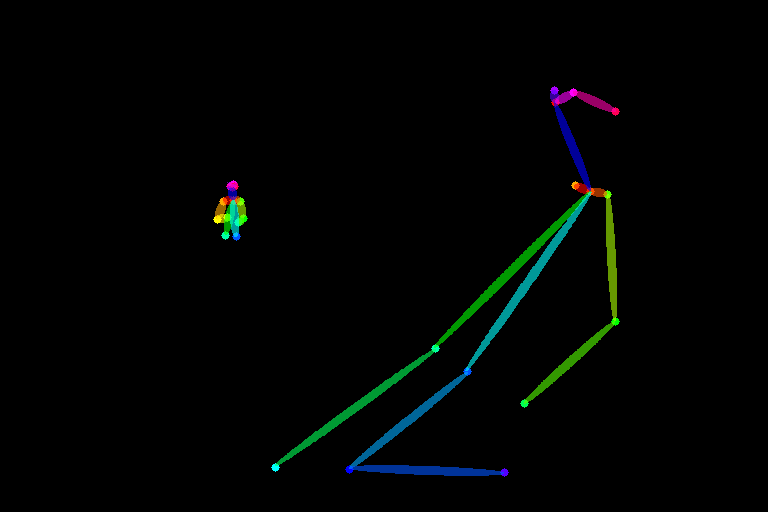

In [31]:
from controlnet_aux import OpenposeDetector

# Q. 아래의 코드를 작성해 주세요.
# 이미지를 불러옵니다.
openpose_image = load_image(
    "https://pds.joongang.co.kr/news/component/htmlphoto_mmdata/202306/30/600bf991-8995-4944-9fb3-d6199f4f7443.jpg"
)

# OpenposeDetector를 사용하여 인체 자세를 검출합니다.
openpose = OpenposeDetector.from_pretrained("lllyasviel/ControlNet")
openpose_image = openpose(openpose_image)

openpose_image

## 윤곽선 검출 + 인체 자세 감지 합쳐서 새로운 이미지 생성하기

In [35]:
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel, UniPCMultistepScheduler

# Q. 코드를 작성해 보세요.
# Edge Detection과 Openpose, 2개의 전처리기를 controlnets라는 리스트로 만듭니다.
controlnets = [canny_controlnet, openpose_controlnet]

# 리스트 controlnets를 파이프라인으로 전달합니다.
pipe = StableDiffusionControlNetPipeline.from_pretrained(
    "runwayml/stable-diffusion-v1-5", controlnet=controlnets, torch_dtype=torch.float16
)

pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)
pipe = pipe.to("cuda")

# 프롬프트를 작성합니다.
prompt = "korean young girl wearing HANBOK behind rainbow mountains"
negative_prompt = "dark, blurry, low quality, abstract, surreal, exaggerated, unrealistic, muted colors, chaotic background, low resolution, rough brushstrokes, cartoonish"

# seed를 지정합니다.
generator = torch.manual_seed(0)

# Resize images to have the same dimensions
# [참고] 윤곽선 검출 이미지와 인체 자세 감지 이미지가 동일한 이미지가 아닌 경우에만 실행
width, height = canny_image.size
openpose_image = openpose_image.resize((width, height))

images = [canny_image, openpose_image]

# 이미지를 생성합니다.
image = pipe(
    prompt=prompt,
    negative_prompt=negative_prompt,
    num_inference_steps=20,
    generator=generator,
    image=images
).images[0]

# 생성된 이미지를 저장합니다.
image.save("multi_controlnet_output.png")

# 생성된 이미지를 출력합니다.
image

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

OutOfMemoryError: CUDA out of memory. Tried to allocate 680.00 MiB. GPU 